In [66]:
import subprocess
import os
import ete3
import random
import numpy as np
from Bio import SeqIO
import pandas as pd
import multiprocessing
from itertools import product
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import random
from scipy.stats import spearmanr, linregress

#
# initial definitions
class cd:
    """
    Context manager for changing the current working directory
    """
    def __init__(self, newPath):
        self.newPath = os.path.expanduser(newPath)

    def __enter__(self):
        self.savedPath = os.getcwd()
        os.chdir(self.newPath)

    def __exit__(self, etype, value, traceback):
        os.chdir(self.savedPath)

%cd /work/site_rate/sequence_simulation/hug

/work/site_rate/sequence_simulation/hug


In [2]:
import matplotlib.colors

cmap = plt.cm.RdBu_r
norm = matplotlib.colors.Normalize(vmin=-1, vmax=12)
colors = ['#%02x%02x%02x' % cmap(norm(index), bytes=8)[:3]
          for index in range(0,13)]

In [3]:
tree = ete3.Tree('reference.tre')
bipartitions   = []
branch_lengths = []
for node in tree.traverse():
    if node.is_leaf() or node.is_root():
        continue
    bipartitions.append(set(node.get_leaf_names()))
    branch_lengths.append(node.dist)

In [4]:
%cd /work/site_rate/sequence_simulation/hug
results = []
for n in range(1, 101):    
    
    compatible_branch_lengths = []
    for category in range(1, 13):
        suptree = ete3.Tree('categories/%i.%i.support.suptree' % (n, category))
        compatible_branch_lengths.append(
            [node.dist for node in suptree.traverse() if not node.is_leaf() and
                                                         not node.is_root() and
                                                             node.support >= 80]
        )
    results.append(compatible_branch_lengths)

/work/site_rate/sequence_simulation/hug


In [10]:
np.percentile(branch_lengths, 25), np.percentile(branch_lengths, 50)

(0.014264038748345335, 0.041907134147391695)

In [14]:
len(results), len(tmp_lengths)

(100, 12)

In [6]:
median_branch_length = np.percentile(branch_lengths, 50)
yeah = []
for tmp_lengths in results:
    yeah.append((sum(np.asarray(tmp_lengths[11]) <= median_branch_length)))

In [28]:
np.mean(yeah)/(len(branch_lengths)/2), len(branch_lengths), len(branch_lengths)/2

(0.7354509018036073, 998, 499.0)

/work/site_rate/sequence_simulation/hug


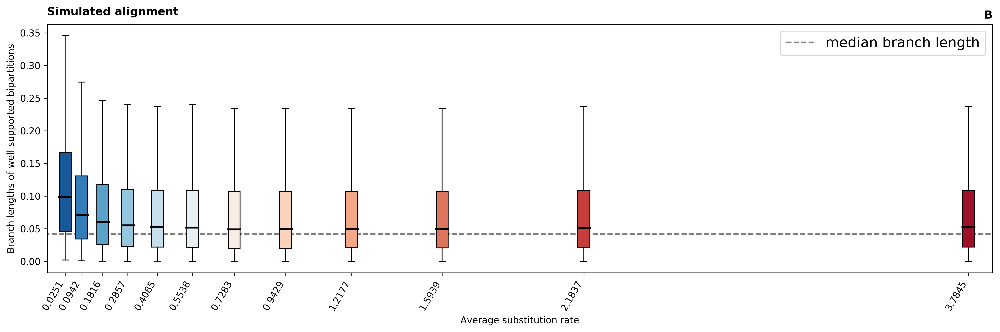

In [62]:
%cd /work/site_rate/sequence_simulation/hug
fig, ax = plt.subplots(dpi=300, figsize=(15,5))

counter   = 100
rates     = pd.read_table('%i.rate' % counter, comment='#')
rates.drop_duplicates('Cat', inplace=True)
rates.sort_values('Cat', inplace=True)

boxplot = ax.boxplot(tmp_lengths, positions=rates.C_Rate.tolist(),
                     widths=0.05,
                     patch_artist=True,
                     showfliers=False,
                     boxprops={'linewidth':1},
                     whiskerprops={'linewidth':1},
                     medianprops={'linewidth':2,
                                  'color':'k'})

ax.plot(ax.get_xlim(), [np.median(branch_lengths), np.median(branch_lengths)], '--',
        c='k', alpha=0.5, label='median branch length')

for patch, color in zip(boxplot['boxes'], colors):
    patch.set_facecolor(color)

ax.set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
ax.set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
fig.suptitle('Simulated alignment', x=0.05, horizontalalignment='left', fontweight='bold')
ax.set_title('B', loc='right', fontweight='bold')
ax.set_xlabel('Average substitution rate')
ax.set_ylabel('Branch lengths of well supported bipartitions')
ax.legend(prop=dict(size=15))
fig.tight_layout()
fig.savefig('/Users/thiberio/Dropbox (MIT)/site_rates-paper/final figures/Figure 3b.pdf')

In [56]:
fig.suptitle?

In [49]:
%cd /work/site_rate/sequence_simulation/hug
fig, axs = plt.subplots(dpi=200, figsize=(10,300), nrows=100)
counter = 0
correlation = []
pvalues     = []
for tmp_lengths, ax in zip(results, axs):
    counter += 1

    rates     = pd.read_table('%i.rate' % counter, comment='#')
    rates.drop_duplicates('Cat', inplace=True)
    rates.sort_values('Cat', inplace=True)

    tmp_corr = spearmanr([np.median(tmp) for tmp in tmp_lengths],
                         rates.C_Rate.tolist())
    correlation.append(tmp_corr.correlation)
    pvalues.append(    tmp_corr.pvalue)

    boxplot = ax.boxplot(tmp_lengths, positions=rates.C_Rate.tolist(),
                         widths=0.05,
                         patch_artist=True,
                         showfliers=False,
                         boxprops={'linewidth':1},
                         whiskerprops={'linewidth':1},
                         medianprops={'linewidth':1,
                                      'color':'k'})

    ax.plot(ax.get_xlim(), [np.median(branch_lengths), np.median(branch_lengths)], '--',
            c='k', alpha=0.5, label='median branch length')

    for patch, color in zip(boxplot['boxes'], colors):
        patch.set_facecolor(color)
    
    ax.set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
    ax.set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
    ax.set_title('Replicate %i' % counter)
fig.tight_layout()

/work/site_rate/sequence_simulation/hug


In [52]:
pvalues     = np.asarray(pvalues)
correlation = np.asarray(correlation)

rejected, corrected, tmp1, tmp2 = multipletests(pvalues, method='fdr_bh')
print(correlation[rejected].mean(), correlation[rejected].std())
correlation[rejected].shape

-0.6907912401263793 0.06059787764440713


(91,)

In [105]:
%cd /work/site_rate/sequence_simulation/hug/categories/rf
random.seed(12345)
fig, axs = plt.subplots(dpi=200, figsize=(10,300), nrows=100)
ax_counter = -1
correlation = []
pvalues     = []
for replicate in range(1, 101):
    if not all(os.path.isfile('%i.%i.rfdist' % (replicate, category)) 
               for category in range(1, 13)):
        print('%i\n\tmissing one of the categories' % replicate)
        continue

    ax_counter += 1
    distances = []
    for category in range(1,13):
        iqtree_result = open('%i.%i.rfdist' % (replicate, category)).readlines()
        iqtree_result.pop(0)
        distances.append([int(line.split()[1]) for line in iqtree_result])
    
    rates     = pd.read_table('../../%i.rate' % replicate, comment='#')
    rates.drop_duplicates('Cat', inplace=True)
    rates.sort_values('Cat', inplace=True)

    tmp_corr = spearmanr([np.median(dist) for dist in distances],
                         [n for n in rates.C_Rate.tolist()])
    
    correlation.append(tmp_corr.correlation)
    pvalues.append(    tmp_corr.pvalue)

    boxplot = axs[ax_counter].boxplot(distances, positions=rates.C_Rate.tolist(),
                         widths=0.05,
                         patch_artist=True,
                         showfliers=False,
                         boxprops={'linewidth':0.1},
                         whiskerprops={'linewidth':1},
                         medianprops={'linewidth':0.1,
                                      'color':'k'})
    for patch, color in zip(boxplot['boxes'], colors):
        patch.set_facecolor(color)
    
    axs[ax_counter].set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
    axs[ax_counter].set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
    axs[ax_counter].set_title('Replicate %i' % replicate)

fig.tight_layout()

/work/site_rate/sequence_simulation/hug/categories/rf


/work/site_rate/sequence_simulation/hug/categories/rf


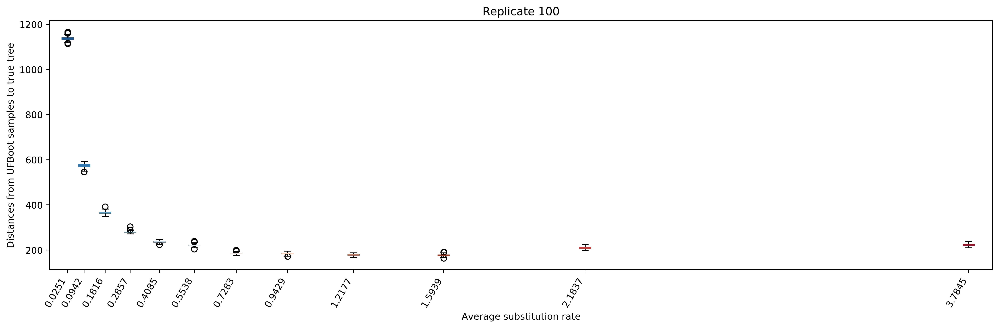

In [9]:
%cd /work/site_rate/sequence_simulation/hug/categories/rf
random.seed(12345)
fig, axs = plt.subplots(dpi=360, figsize=(15,5))

replicate = 100
distances = []
for category in range(1,13):
    iqtree_result = open('%i.%i.rfdist' % (replicate, category)).readlines()
    iqtree_result.pop(0)
    distances.append([int(line.split()[1]) for line in iqtree_result])

rates     = pd.read_table('../../%i.rate' % replicate, comment='#')
rates.drop_duplicates('Cat', inplace=True)
rates.sort_values('Cat', inplace=True)

boxplot = axs.boxplot(distances, positions=rates.C_Rate.tolist(),
                     widths=0.05,
                     patch_artist=True,
                     showfliers=True,
                     boxprops={'linewidth':0.1},
                     whiskerprops={'linewidth':1},
                     medianprops={'linewidth':0.1,
                                  'color':'k'})
for patch, color in zip(boxplot['boxes'], colors):
    patch.set_facecolor(color)

axs.set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
axs.set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
axs.set_title('Replicate %i' % replicate)
axs.set_xlabel('Average substitution rate')
axs.set_ylabel('Distances from UFBoot samples to true-tree')

fig.tight_layout()
#fig.savefig('/Users/thiberio/Dropbox (MIT)/site_rates-paper/final figures/Figure 1b.pdf')

In [37]:
fig, ax = plt.subplots(dpi=1200, figsize=(15,5))
for i,j in enumerate(distances, 1):
    if i <= 4:
        linestyle = '--'
    elif i <= 8:
        linestyle = '-'
    else:
        linestyle = ':'
    sns.kdeplot(j, shade=True, label= 'RSAP%i' % i, ax=ax, linestyle=linestyle)
ax.set_ylabel('Kernel density')
ax.set_xlabel('Distances from UFBoot samples to true-tree')
ax.set_xlim(150, 1200)
ax.legend(ncol=3)
fig.tight_layout()
fig.savefig('/Users/thiberio/Dropbox (MIT)/site_rates-paper/final figures/Figure 1b.pdf')

In [41]:
from statsmodels.sandbox.stats.multicomp import multipletests
pvalues     = np.asarray(pvalues)
correlation = np.asarray(correlation)

rejected, corrected, tmp1, tmp2 = multipletests(pvalues, method='fdr_bh')
correlation[rejected].mean(), correlation[rejected].std()

(-0.7023773214404535, 0.06341955725016757)

In [119]:
%cd /work/site_rate/sequence_simulation/hug/categories/rf
random.seed(12345)
slopes = []
pvals = []
rhos = []
for replicate in range(1, 101):
    if not all(os.path.isfile('%i.%i.rfdist' % (replicate, category)) 
               for category in range(1, 13)):
        print('%i\n\tmissing one of the categories' % replicate)
        continue

    distances = []
    for category in range(1,13):
        iqtree_result = open('%i.%i.rfdist' % (replicate, category)).readlines()
        iqtree_result.pop(0)
        distances.append([int(line.split()[1]) for line in iqtree_result])
    
    rates     = pd.read_table('../../%i.rate' % replicate, comment='#')
    rates.drop_duplicates('Cat', inplace=True)
    rates.sort_values('Cat', inplace=True)

    x = rates.C_Rate.tolist()[-4:]
    y = [np.median(n) for n in distances[-4:]]
    regression = linregress(x,y)
    slopes.append(regression.slope)
    pvals.append(regression.pvalue)
    rhos.append(regression.rvalue)

/work/site_rate/sequence_simulation/hug/categories/rf


In [135]:
pvals = np.asarray(pvals)
rhos  = np.asarray(rhos)
slopes  = np.asarray(slopes)

In [136]:
np.mean(slopes), np.std(slopes)

(26.23800577564768, 9.100358539942986)

In [137]:
slopes[pvals <= 0.05].mean(), slopes[pvals <= 0.05].std()

(31.62219692698356, 7.646352829687636)

In [100]:
rhos[pvals <= 0.05].mean()

0.97741850296446

In [93]:
pvals[pvals <= 0.05].shape

(42,)

Text(254.25, 0.5, 'Kernel density')

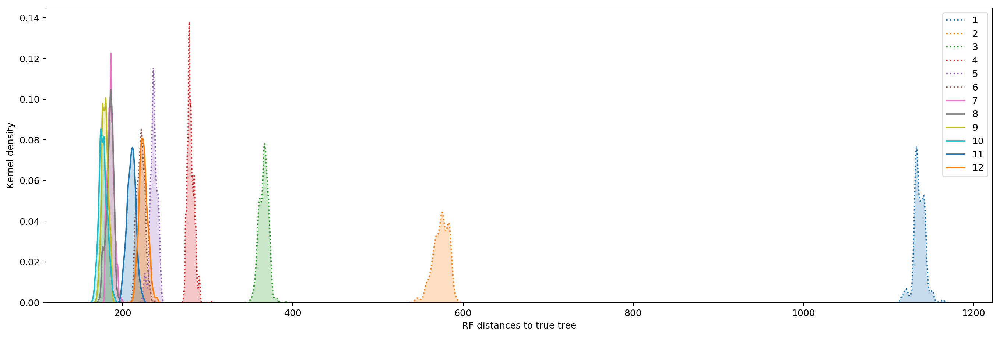

In [127]:
fig, ax = plt.subplots(dpi=180, figsize=(15,5))
for i,j in enumerate(distances, 1):
    if i > 6:
        linestyle = '-'
    else:
        linestyle = ':'
    sns.kdeplot(j, shade=True, label=i, ax=ax, linestyle=linestyle)
fig.tight_layout()
ax.set_xlabel('RF distances to true tree')
ax.set_ylabel('Kernel density')

In [68]:
from scipy.spatial.distance import squareform

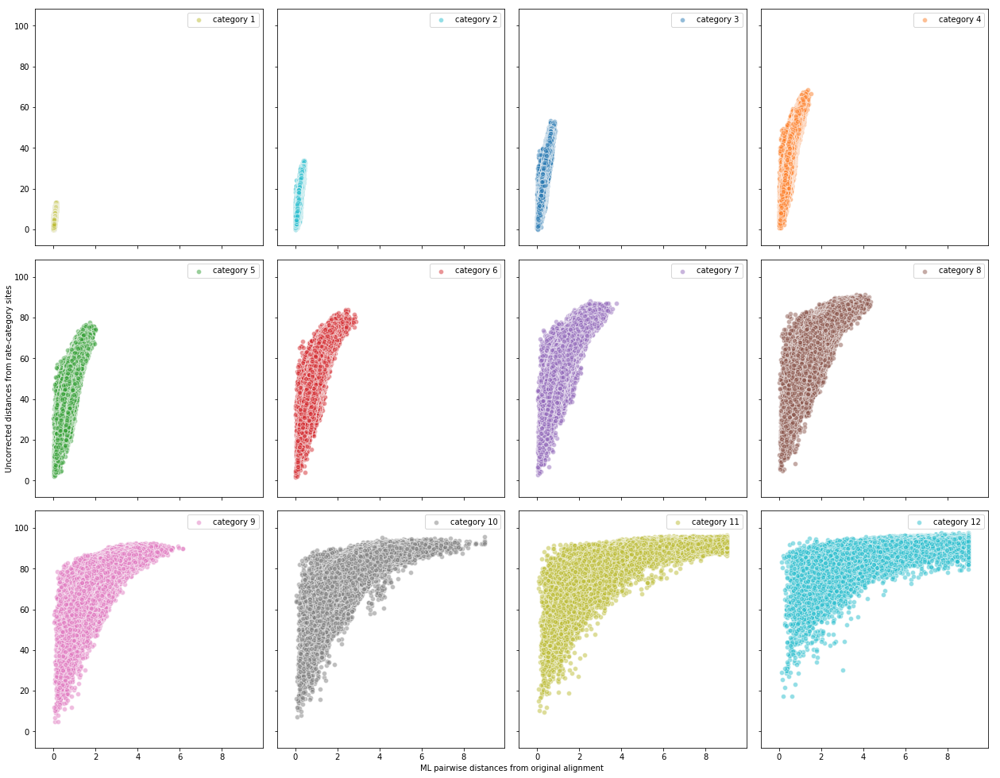

In [69]:
colors = '#29bece #bcbc35 #7f7f7f #e17ac1 #8b564c #936abb #d42a2f #339f34 #fd7f28 #2678b2 #29bece #bcbc35 '.split()
colors.reverse()
fig, axs  = plt.subplots(nrows=3, ncols=4, sharex=True, sharey=True)
replicate = 1

with cd('categories'):
    row = col = 0
    for category in range(1, 13):
        if category  in [1,2,3,4]:
            row = 0
        elif category in [5,6,7,8]:
            row = 1
        else:
            row = 2

        if category in [1,5,9]:
            col = 0
        elif category in [2,6,10]:
            col = 1
        elif category in [3,7,11]:
            col = 2
        else:
            col = 3

        sorted_taxa = re.findall('^>(\S+)',
                                 open('%i.%i.aln' % (replicate, category)).read(),
                                 re.M)
        
        ml_distances = pd.read_table('%i.%i.mldist' % (replicate, category),
                             index_col=0,
                             header=None,
                             skiprows=1,
                             sep=r'\s+')
        ml_distances.columns = ml_distances.index

        uncorrected_distances = pd.read_table('%i.%i.distmat' % (replicate, category),
                                              skiprows=7, header=None, index_col=-1)
        uncorrected_distances.drop([0, 132], axis='columns', inplace=True)
        uncorrected_distances.columns = uncorrected_distances.index = sorted_taxa

        lower_triangle_indexes = np.tril_indices(uncorrected_distances.shape[0], -1)
        uncorrected_distances.values[lower_triangle_indexes] = uncorrected_distances.T.values[lower_triangle_indexes]

        uncorrected_distances = uncorrected_distances.reindex(index=ml_distances.index,
                                                              columns=ml_distances.columns,
                                                              tolerance=0)

        plot = sns.scatterplot(squareform(ml_distances.values),
                               squareform(uncorrected_distances.values, checks=False),
                               ax=axs[row, col], label='category %i' % category, alpha=0.5,
                               color=colors[category-1]
                               )

commom_area = fig.add_subplot(111, frameon=False)
commom_area.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
commom_area.set_xlabel('ML pairwise distances from original alignment')
commom_area.set_ylabel('Uncorrected distances from rate-category sites')

fig.set_size_inches(18,14)
fig.tight_layout()
fig.savefig('/Users/thiberio/Dropbox (MIT)/site_rates-paper/final figures/supplementary_figures/Figure S2.pdf')
fig.savefig('/Users/thiberio/Dropbox (MIT)/site_rates-paper/final figures/supplementary_figures/Figure S2.png',
            dpi=300)
#plt.close()


In [148]:
import re
from scipy.spatial.distance import squareform

/work/site_rate/sequence_simulation/hug/jtt_categories


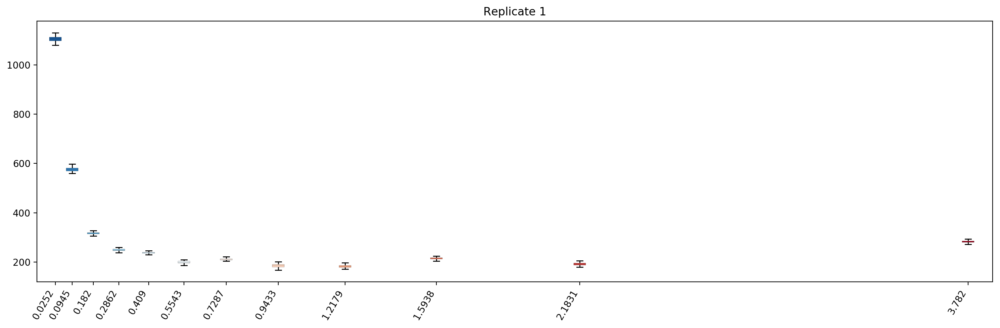

In [102]:
%cd /work/site_rate/sequence_simulation/hug/jtt_categories/
random.seed(12345)
fig, ax = plt.subplots(dpi=200, figsize=(15,5))
ax_counter = -1
median_rfs   = []
median_rates = []
for replicate in range(1, 101)[:1]:
    ax_counter += 1
    distances = []
    for category in range(1,13):
        iqtree_result = open('jtt_rf_%i.%i.rfdist' % (replicate, category)).readlines()
        iqtree_result.pop(0)
        distances.append([int(line.split()[1]) for line in iqtree_result])
    
    rates     = pd.read_table('../%i.rate' % replicate, comment='#')
    rates.drop_duplicates('Cat', inplace=True)
    rates.sort_values('Cat', inplace=True)

    boxplot = ax.boxplot(distances, positions=rates.C_Rate.tolist(),
                         widths=0.05,
                         patch_artist=True,
                         showfliers=False,
                         boxprops={'linewidth':0.1},
                         whiskerprops={'linewidth':1},
                         medianprops={'linewidth':0.1,
                                      'color':'k'})
    for patch, color in zip(boxplot['boxes'], colors):
        patch.set_facecolor(color)
    
    ax.set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
    ax.set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
    ax.set_title('Replicate %i' % replicate)

fig.tight_layout()

In [24]:
distances = []
for category in range(1,13):
    iqtree_result = open('jtt_rf_%i.%i.rfdist' % (replicate, category)).readlines()
    iqtree_result.pop(0)
    distances.append([int(line.split()[1]) for line in iqtree_result])

rates     = pd.read_table('../%i.rate' % replicate, comment='#')
rates.drop_duplicates('Cat', inplace=True)
rates.sort_values('Cat', inplace=True)

x = rates.C_Rate.tolist()[-4:]
y = [np.median(n) for n in distances[-4:]]
linregress(x,y).slope

36.05282494929312

/work/site_rate/sequence_simulation/hug/dayhoff_categories


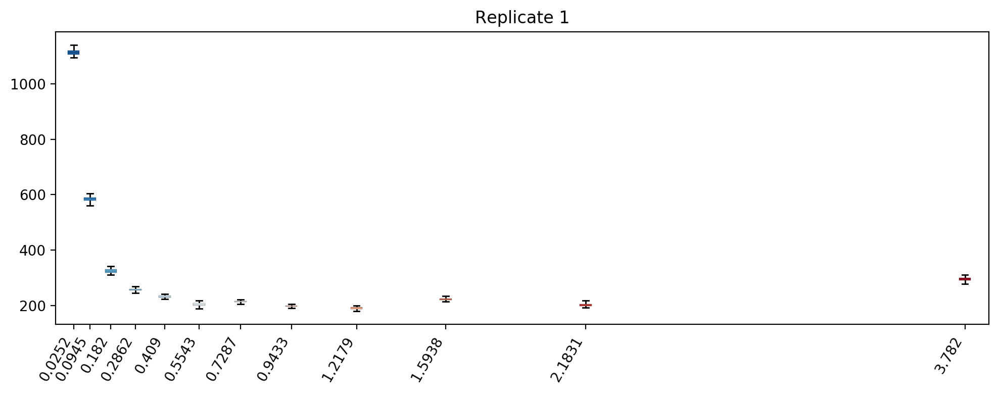

In [26]:
%cd /work/site_rate/sequence_simulation/hug/dayhoff_categories/
random.seed(12345)
fig, ax = plt.subplots(dpi=200, figsize=(10,4))
ax_counter = -1
median_rfs   = []
median_rates = []
for replicate in range(1, 101)[:1]:
    ax_counter += 1
    distances = []
    for category in range(1,13):
        iqtree_result = open('dayhoff_rf_%i.%i.rfdist' % (replicate, category)).readlines()
        iqtree_result.pop(0)
        distances.append([int(line.split()[1]) for line in iqtree_result])
    
    rates     = pd.read_table('../%i.rate' % replicate, comment='#')
    rates.drop_duplicates('Cat', inplace=True)
    rates.sort_values('Cat', inplace=True)

    boxplot = ax.boxplot(distances, positions=rates.C_Rate.tolist(),
                         widths=0.05,
                         patch_artist=True,
                         showfliers=False,
                         boxprops={'linewidth':0.1},
                         whiskerprops={'linewidth':1},
                         medianprops={'linewidth':0.1,
                                      'color':'k'})
    for patch, color in zip(boxplot['boxes'], colors):
        patch.set_facecolor(color)
    
    ax.set_xticklabels([round(n, 4) for n in rates.C_Rate.tolist()], rotation=60, ha='right')
    ax.set_xlim(-0.05, rates.C_Rate.tolist()[-1]+0.1)
    ax.set_title('Replicate %i' % replicate)

fig.tight_layout()

In [27]:
distances = []
for category in range(1,13):
    iqtree_result = open('dayhoff_rf_%i.%i.rfdist' % (replicate, category)).readlines()
    iqtree_result.pop(0)
    distances.append([int(line.split()[1]) for line in iqtree_result])

rates     = pd.read_table('../%i.rate' % replicate, comment='#')
rates.drop_duplicates('Cat', inplace=True)
rates.sort_values('Cat', inplace=True)

x = rates.C_Rate.tolist()[-4:]
y = [np.median(n) for n in distances[-4:]]
linregress(x,y).slope

38.335215213409995